In [55]:
import mdtraj as md
import numpy as np
import pandas as pd
import encodermap as em
import seaborn as sns
import encodermap as em
import tensorflow as tf
import loading_lizard as ll
import matplotlib as mpl
import nglview as ngl
import matplotlib.pyplot as plt
import simtk.openmm.app as app
import simtk.openmm as mm
from custom_gromacstopfile import CustomGromacsTopFile
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import glob, os, re, sys, copy, pickle, itertools, pyemma

%load_ext autoreload
%autoreload 2
%matplotlib notebook

import warnings
warnings.simplefilter("ignore", category=PendingDeprecationWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Meeting 08.04.2021


## Talking points

- Data overview AA and CG
- Collect data
- Train neural network
- Cluster data
- Backmapping
- XPLOR-NIH dynamics

# Data overview

**All-atom simulations of K6 linked diUbi: $0.6 \mu s$.**

In [157]:
view = ngl.show_file('2xUBQ_aa.gro')
view.clear_representations()
view.add_representation('ball+stick')
view

NGLWidget()

**Coarse-grained simulations of K6 linked diUbi: $240 \mu s$.**

In [4]:
view = ngl.show_file('2xUBQ_cg.pdb')
view.clear_representations()
view.add_representation('ball+stick', aspectRatio=10)
view

NGLWidget()

**How do they map?**

<div><img src='2xUBQ_CG_overlayed_to_atomistic.png', width=1200></div>

# Collect data

Atomisitc data is shaped like so:

<div><img src='xyz_data.png', width=800></div>

Select CA distances as a subset to reduce the amount of data.

<div><img src='CA_distances_1.png', width=1200></div>

This flattens the input into a two-dimensional array. Where every frame is mapped to a 11.000-dimensional point.

<div><img src='CA_distances_2.png', width=800></div>

# Train neural network

Fully connected neural network with a bottleneck -> Autoencoder

<table><tr>
<td> <img src='neuron.png', width=500> </td>
<td> <img src='NN.png', width=500> </td>
</tr></table>


**Opimizer minimizes cost functions.**

<p><img src='NN_training.png', width=800></p>

<IPython.core.display.Javascript object>


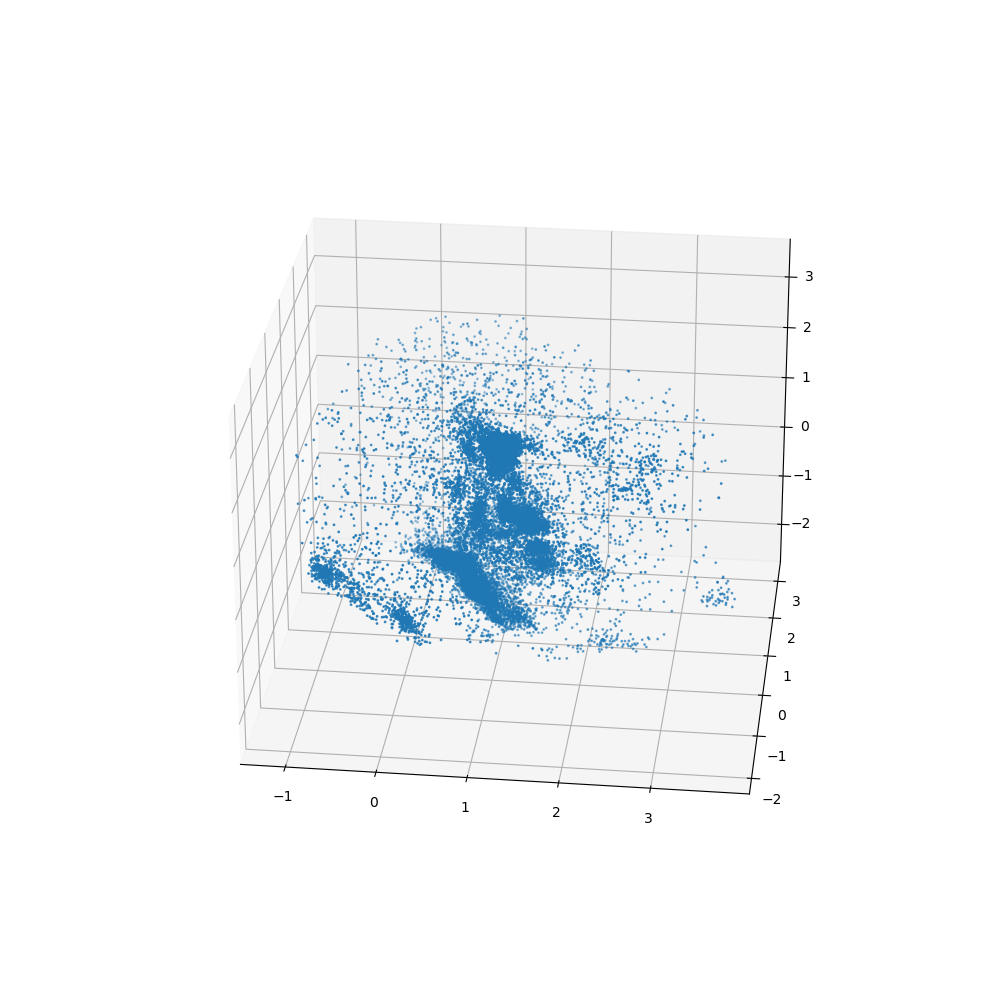

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs dire

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

In [158]:
plt.close('all')
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(*trajs.lowd[::100,:3].T, s=1)

## Much more points due to CG data

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


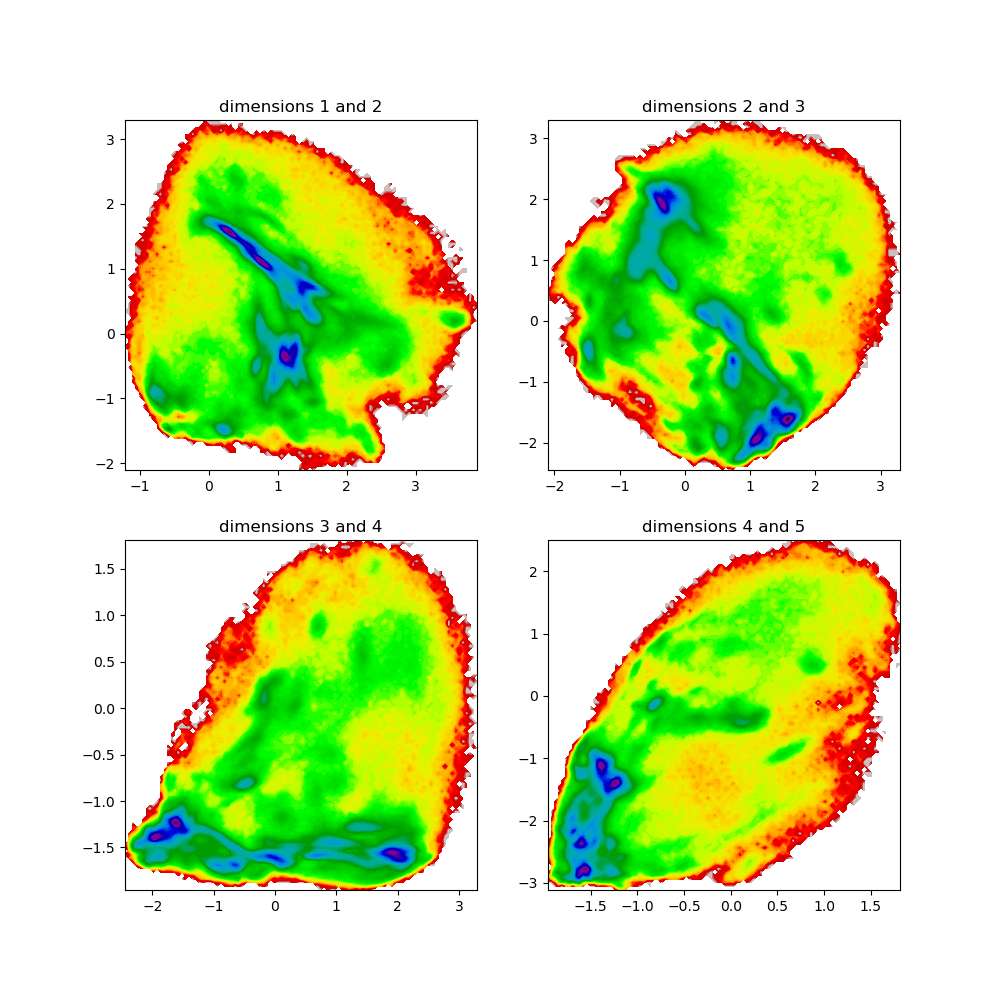

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs dire

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/pyemma/plots/plots2d.py:651: DeprecationWarning: Legacy mode is deprecated is will be removed in the next major release. Until then use legacy=False
  _warn(
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_m

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

Text(0.5, 1.0, 'dimensions 4 and 5')

In [159]:
plt.close('all')
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, figsize=(10, 10))
pyemma.plots.plot_free_energy(*trajs.lowd[:,0:2].T, ax=ax1, cbar=False)
ax1.set_title('dimensions 1 and 2')
pyemma.plots.plot_free_energy(*trajs.lowd[:,1:3].T, ax=ax2, cbar=False)
ax2.set_title('dimensions 2 and 3')
pyemma.plots.plot_free_energy(*trajs.lowd[:,2:4].T, ax=ax3, cbar=False)
ax3.set_title('dimensions 3 and 4')
pyemma.plots.plot_free_energy(*trajs.lowd[:,3:5].T, ax=ax4, cbar=False)
ax4.set_title('dimensions 4 and 5')

# Clusters data

In [160]:
plt.close('all')
color_palette = sns.color_palette('deep', clusterer.labels_.max() + 1)
cluster_colors = [(*color_palette[x], 1) if x >= 0
                  else (0.5, 0.5, 0.5, 0.05)
                  for x in clusterer.labels_]
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(*trajs.lowd[::10,:3].T, c=cluster_colors[::10], s=5)

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

ValueError: 'c' argument has 7616 elements, which is inconsistent with 'x' and 'y' with size 247619.

<IPython.core.display.Javascript object>


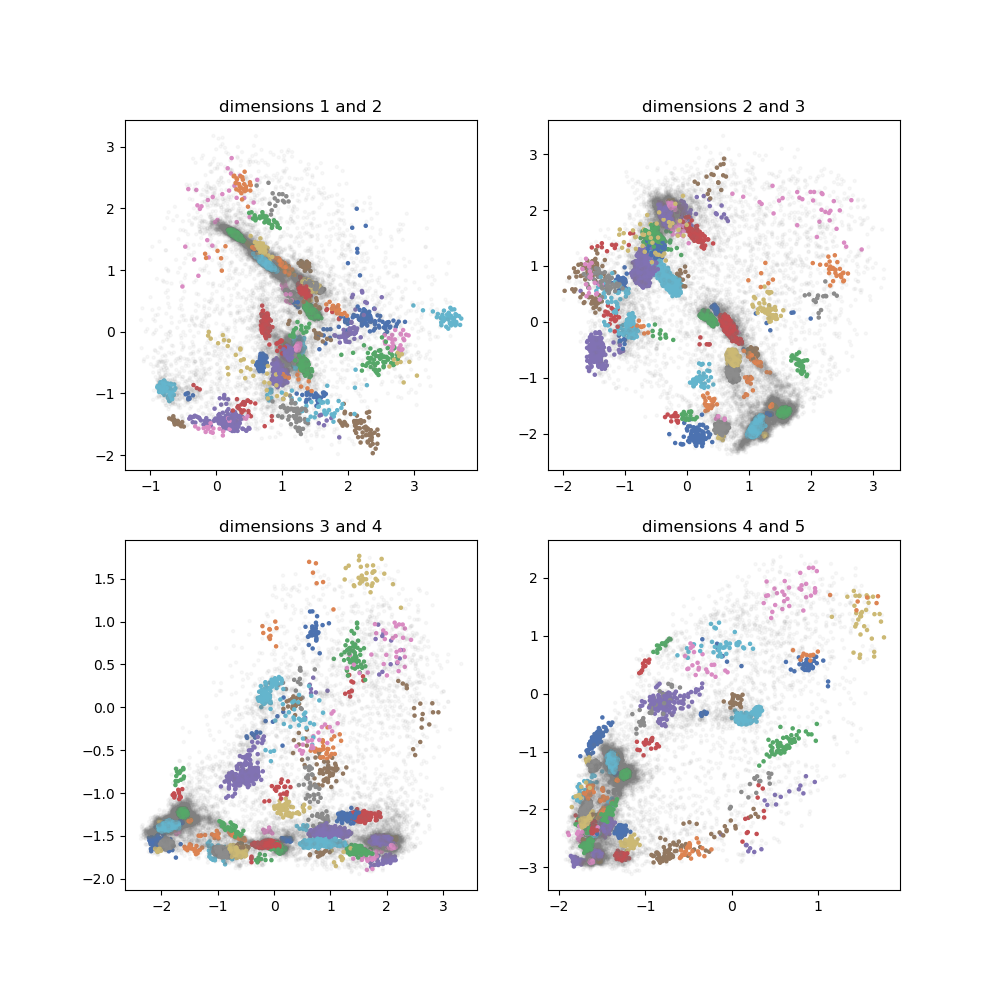

Text(0.5, 1.0, 'dimensions 4 and 5')

In [58]:
plt.close('all')
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, figsize=(10, 10))
ax1.scatter(*trajs.lowd[::100,0:2].T, s=5, c=cluster_colors[::100])
ax1.set_title('dimensions 1 and 2')
ax2.scatter(*trajs.lowd[::100,1:3].T, s=5, c=cluster_colors[::100])
ax2.set_title('dimensions 2 and 3')
ax3.scatter(*trajs.lowd[::100,2:4].T, s=5, c=cluster_colors[::100])
ax3.set_title('dimensions 3 and 4')
ax4.scatter(*trajs.lowd[::100,3:5].T, s=5, c=cluster_colors[::100])
ax4.set_title('dimensions 4 and 5')

In [29]:
def os_walk(dir_, resolution='aa'):
    traj_files = []
    pdb_files = []
    for root, dirs, files in os.walk(dir_, topdown=False):
        if 'preproc' in root or 'triUBQ' in root or 'tetraUBQ' in root:
            continue
        if 'k6' in root.lower() and not 'k63' in root.lower() and not 'monoub' in root.lower():
            for name in files:
                if name.endswith('xtc'):
                    if 'comp' in name:
                        found_file = os.path.join(root, name)
                        if check_ff(root, resolution=resolution):
                            traj_files.append(found_file)
                            pdb_files.append(os.path.join(root, 'confout.gro'))
                    elif 'nojump' in name:
                        found_file = os.path.join(root, name)
                        if check_ff(root, resolution=resolution):
                            traj_files.append(found_file)
                            pdb_files.append(os.path.join(root, 'start.pdb'))
                    elif name == 'traj.xtc':
                        pass
                    else:
                        print(name)
                        print(root)
                        print(os.listdir(root))
                        raise Exception("Unkown traj name.")
            for name in dirs:
                pass
    return traj_files, pdb_files
            
def check_ff(dir_, resolution='aa'):
    pdb_file = os.path.join(dir_, 'start.pdb')
    top_file = os.path.join(dir_, 'system.top')
    gro_file = os.path.join(dir_, 'confout.gro')
    if os.path.isfile(pdb_file):
        file = pdb_file
    elif os.path.isfile(top_file):
        file = top_file
    elif os.path.isfile(gro_file):
        file = gro_file
    else:
        print(dir_)
        print(os.listdir(dir_))
        raise Exception("Could not find start.pdb, system.top or confout.gro")
        
    with open(file, 'r') as f:
        line = f.readline()
        line2 = f.readline()
    if 'martini' in line.lower():
        out = False
    elif 'protein in water' in line.lower():
        out =  True
    elif 'top_G54A7' in line2:
        out =  True
    elif '[ defaults ]' in line:
        with open(file, 'r') as f:
            lines = f.read()
        if 'MARTINI' in lines:
            out =  False
        else:
            print(lines)
            raise Exception("Could not find system type in full topology file.")
    else:
        print(file)
        print(line)
        raise Exception("Unkonw system type")
        
    if resolution == 'cg':
        return not out
    return out
            
sims_dir = '/home/andrejb/Research/SIMS/'

aa_trajs, aa_pdbs = os_walk(sims_dir)
cg_trajs, cg_pdbs = os_walk(sims_dir, resolution='cg')
assert len(aa_trajs) == len(aa_pdbs)
assert len(cg_trajs) == len(cg_pdbs)

In [1]:
trajs = []
for traj_file, top_file in zip(cg_trajs + aa_trajs, cg_pdbs + aa_pdbs):
    trajs.append(em.Info_single(traj_file, top_file))
trajs = em.Info_all(trajs)

NameError: name 'cg_trajs' is not defined

In [31]:
for traj in trajs:
    new_basename = traj.traj_file.split('/')[-2]
    lowd_file = f'AA_and_CG_pairwise_distances/{new_basename}.npy'
    traj.load_CV(lowd_file, 'lowd')

In [32]:
class Clusterer:
    pass
clusterer = Clusterer
clusterer.labels_ = np.load('clusterer_AA_and_CG_labels.npy')

In [33]:
from encodermap.misc.xarray import add_one_by_one
splits = add_one_by_one([traj.lowd.shape[1] for traj in trajs])[:-1]
splitted_cluster_labels = np.split(clusterer.labels_, splits)
for i, traj in enumerate(trajs):
    traj.load_CV(splitted_cluster_labels[i], 'cluster_membership')

In [34]:
name_arr = []
for traj in trajs:
    name_arr.extend([traj.traj_file.split('/')[-2] for i in range(len(traj.cluster_membership))])
name_arr = np.array(name_arr)

In [40]:
view, dummy_traj = em.misc.clustering.gen_dummy_traj(trajs, 0, shorten=True, align_string='name BB', stack_atoms=True, nglview=True)

/home/kevin/projects/encoder_map_private/encodermap/misc/clustering.py:82: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if isinstance(cluster_no, (int, np.int, np.int64, np.int32)):
/home/kevin/projects/encoder_map_private/encodermap/misc/clustering.py:113: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to revi

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

Provided alignment string results in 152 atoms. First atom is MET1-BB. Last atom is GLY152-BB.
superposed


In [42]:
view.clear_representations()
view.add_representation('ball+stick', aspectRatio=10)
view

NGLWidget(n_components=1)

In [61]:
traj = md.load('CA_distances_cluster_trajs/cluster_0/joined.xtc', top='CA_distances_cluster_trajs/cluster_0/cluster_0_frame_0.pdb')
for i, frame in enumerate(traj):
    if i == 0:
        out = copy.deepcopy(frame)
    else:
        out = out.stack(frame)
view = ngl.show_mdtraj(out)
view

NGLWidget()

# Backmapping

<img src="animatedlogo_small.gif" width="750" align="center">

**However energy is still very high -> L-BFGS Energy minimization using `Backward` by Andrej Berg and Kai Riedmiller**

Uses Gromacs L-BFGS iterator and not OpenMM (sadly :()

https://github.com/KRiedmiller/Backward

# Run XPLOR dynamics

## Protocol:

```python
import protocol
    
    # create psolpot
    radius = 1.4
    protocol.loadPDB(pdb_file, deleteUnknownAtoms=True)
    from psolPotTools import create_PSolPot
    psol = create_PSolPot("psol", file=psol_restraints)

    # psol options
    psol.setRmin(0.8)
    #psol.setRadMax(30.0)
    #psol.setThkIni(1.0)
    #psol.setThkFac(1.4)
    #psol.setTcType("fix")
    psol.setTauC(0.2)
    #psol.setPconc(4.0)
    psol.setSqn(3.5)
    psol.setRho0(0.24)
    psol.setScale(1.7)
    psol.setFreqI(freq)
    psol.tessellation().setVerbose(True)
    psol.setThreshold(0)
    psol.setProbeRadius(radius)
    psol.setRadiusOffset(radius)

    # create relaxpot
    from diffPotTools import readInRelaxData
    relax_data_in = readInRelaxData(relax_restraints, pattern=['resid', 'R1', 'R1_err', 'R2', 'R2_err', 'NOE', 'NOE_err'])
    from relaxRatioPotTools import create_RelaxRatioPot
    r_ratio = create_RelaxRatioPot('rrp', data_in=relax_data_in, freq=freq, temperature=temp)
    
    # dynamics in internal coordinates
    from ivm import IVM
    dyn = IVM()
    protocol.torsionTopology(dyn)
    protocol.initDynamics(dyn, bathTemp=temp, printInterval=1, numSteps=nsteps, potList=[psol, r_ratio])
    
    # run dyn
    dyn.run()
```

## Output

```
  Violated PSol restraints in potential term: psol

 id   atoms in selection        obs     calc    diff  minDist
--------------------------------------------------------------------------
  0 (      A    2  GLN   HN)   4.025   2.169   1.856   2.400
  1 (      A    3  ILE   HN)   1.349  0.4361  0.9129   5.955
  2 (      A    4  PHE   HN)   5.181  0.3602   4.821   6.536
  3 (      A    5  VAL   HN)   4.749  0.3220   4.427   6.905
  4 (      A    7  THR   HN)   2.905  0.4419   2.463   6.745
  5 (      A    8  LEU   HN)   5.686  0.9127   4.773   4.226
  6 (      A    9  THR   HN)   11.25   1.972   9.280   3.362
  7 (      A   10  GLY   HN)   7.238   2.134   5.104   3.597
  8 (      A   11  LYS   HN)   6.957   1.115   5.842   5.002
  9 (      A   12  THR   HN)   29.52   5.945   23.57   2.400
 10 (      A   13  ILE   HN)   5.202  0.6622   4.540   4.318
 11 (      A   14  THR   HN)   13.12   2.887   10.23   2.691
 12 (      A   15  LEU   HN)   3.462  0.5128   2.949   4.939
 13 (      A   16  GLU   HN)   5.504   2.955   2.549   2.400
 14 (      A   17  VAL   HN)   2.169  0.7682   1.401   4.412
 15 (      A   18  GLU   HN)   1.277   1.863  0.5864   3.145
 16 (      A   20  SER   HN)   4.160   3.071   1.089   2.795
 17 (      A   21  ASP   HN)   2.397   1.099   1.298   4.459
 18 (      A   22  THR   HN)   3.587   2.554   1.033   2.395
 19 (      A   23  ILE   HN)   3.357  0.5320   2.825   5.708
 20 (      A   24  GLU   HN)   0.000  0.7681  0.7681   5.330
 21 (      A   25  ASN   HN)   3.144   1.705   1.439   3.043
 22 (      A   26  VAL   HN)   2.288  0.4466   1.841   5.630
 23 (      A   27  LYS   HN)   1.234  0.3989  0.8351   5.416
 24 (      A   28  ALA   HN)   2.652   1.657  0.9951   3.025
 25 (      A   29  LYS   HN)   2.558  0.9848   1.573   3.797
 26 (      A   30  ILE   HN)   1.778  0.3793   1.399   6.163
 27 (      A   31  GLN   HN)   3.521  0.6243   2.897   4.886
 28 (      A   32  ASP   HN)   3.861   2.121   1.740   2.852
 29 (      A   33  LYS   HN)   4.485   1.174   3.311   4.907
 30 (      A   34  GLU   HN)   3.990   1.246   2.744   4.286
 31 (      A   35  GLY   HN)   7.371   3.631   3.740   2.297
 32 (      A   36  ILE   HN)   3.694   2.019   1.675   3.302
 33 (      A   39  ASP   HN)   5.682   3.907   1.775   2.335
 34 (      A   40  GLN   HN)   4.151   1.132   3.019   3.987
 35 (      A   41  GLN   HN)   5.418  0.4618   4.956   6.147
 36 (      A   42  ARG   HN)   4.883  0.3639   4.519   6.361
 37 (      A   43  LEU   HN)   2.333  0.2833   2.050   7.085
 38 (      A   44  ILE   HN)   2.242  0.4480   1.794   4.892
 39 (      A   45  PHE   HN)   5.080  0.6639   4.416   5.317
 40 (      A   46  ALA   HN)   13.22   4.709   8.516   2.400
 41 (      A   47  GLY   HN)   21.98   8.095   13.88   2.400
 42 (      A   48  LYS   HN)   8.601   3.682   4.919   2.799
 43 (      A   49  GLN   HN)   16.97   5.609   11.36   2.400
 44 (      A   50  LEU   HN)   4.207  0.4308   3.776   5.833
 45 (      A   51  GLU   HN)   4.720  0.9479   3.772   3.870
 46 (      A   52  ASP   HN)   13.82   1.892   11.93   3.255
 47 (      A   53  GLY   HN)   0.000   2.996   2.996   2.476
 48 (      A   54  ARG   HN)   3.681   1.085   2.596   4.645
 49 (      A   55  THR   HN)   2.853   2.174  0.6793   3.044
 50 (      A   56  LEU   HN)   1.113  0.5428  0.5702   5.842
 51 (      A   57  SER   HN)   2.204   1.263  0.9409   3.968
 52 (      A   58  ASP   HN)   3.108   1.396   1.712   3.816
 53 (      A   59  TYR   HN)   5.735  0.7719   4.963   5.248
 54 (      A   60  ASN   HN)   4.894   1.478   3.416   3.926
 55 (      A   61  ILE   HN)   2.985   1.134   1.851   3.582
 56 (      A   62  GLN   HN)   4.320   1.993   2.327   3.878
 57 (      A   63  LYS   HN)   4.482   3.597  0.8849   2.400
 58 (      A   64  GLU   HN)   7.019  0.7091   6.310   5.523
 59 (      A   65  SER   HN)   4.616  0.8120   3.804   4.515
 60 (      A   66  THR   HN)   13.75   4.082   9.665   2.465
 61 (      A   67  LEU   HN)   2.817  0.4374   2.380   5.957
 62 (      A   68  HIS   HN)   2.420  0.4784   1.942   5.554
 63 (      A   69  LEU   HN)   2.234  0.3613   1.873   5.595
 64 (      A   70  VAL   HN)   3.020  0.4908   2.529   5.089
 65 (      A   71  LEU   HN)   9.435   1.765   7.670   3.019
 66 (      A   72  ARG   HN)   6.135  0.7498   5.385   4.666
 67 (      A   73  LEU   HN)   17.91   3.985   13.93   2.400
 68 (      A   74  ARG   HN)   16.06   3.642   12.42   2.832
 69 (      A   75  GLY   HN)   11.77   8.664   3.110   2.400
 70 (      A   78  GLN   HN)   3.677   4.320  0.6429   2.400
 71 (      A   79  ILE   HN)   2.039  0.4390   1.600   6.331
 72 (      A   80  PHE   HN)   0.000  0.5087  0.5087   5.323
 73 (      A   81  VAL   HN)   2.009  0.3311   1.678   7.154
 74 (      A   84  LEU   HN)   2.949   1.546   1.403   3.255
 75 (      A   85  THR   HN)   8.380   2.803   5.577   2.758
 76 (      A   86  GLY   HN)   8.026   1.453   6.573   4.617
 77 (      A   87  LYS   HN)   9.190   1.623   7.567   3.600
 78 (      A   88  THR   HN)   38.48   4.347   34.13   2.358
 79 (      A   89  ILE   HN)   5.240  0.5956   4.644   4.947
 80 (      A   90  THR   HN)   14.60   3.163   11.44   2.451
 81 (      A   91  LEU   HN)   1.716  0.4873   1.229   5.715
 82 (      A   92  GLU   HN)   4.095   2.163   1.932   2.400
 83 (      A   93  VAL   HN)   0.000  0.6302  0.6302   5.381
 84 (      A   94  GLU   HN)  0.2570  0.9682  0.7112   4.348
 85 (      A   96  SER   HN)   4.023   2.727   1.296   2.773
 86 (      A   97  ASP   HN)   1.562  0.8994  0.6626   4.969
 87 (      A   98  THR   HN)   1.564   2.254  0.6896   2.511
 88 (      A   99  ILE   HN)   4.154  0.4842   3.670   6.205
 89 (      A  100  GLU   HN)   0.000  0.8056  0.8056   4.587
 90 (      A  101  ASN   HN)   3.697   1.302   2.395   3.486
 91 (      A  102  VAL   HN)  0.7460  0.4139  0.3321   5.712
 92 (      A  103  LYS   HN)   0.000  0.3176  0.3176   6.316
 93 (      A  104  ALA   HN)   1.531   1.040  0.4914   3.882
 94 (      A  105  LYS   HN)  0.5940  0.8312  0.2372   4.531
 95 (      A  106  ILE   HN)  0.3390  0.3673 0.02828   5.983
 96 (      A  107  GLN   HN)   0.000  0.5933  0.5933   5.831
 97 (      A  108  ASP   HN)   3.517   1.419   2.098   4.054
 98 (      A  109  LYS   HN)   4.667   1.290   3.377   4.120
 99 (      A  110  GLU   HN)   3.822   1.212   2.610   4.684
100 (      A  111  GLY   HN)   8.921   5.057   3.864   2.400
101 (      A  112  ILE   HN)   4.169   1.387   2.782   3.942
102 (      A  115  ASP   HN)   5.789   2.393   3.396   2.569
103 (      A  116  GLN   HN)   2.267  0.7151   1.552   4.992
104 (      A  117  GLN   HN)   2.998  0.4299   2.568   5.387
105 (      A  118  ARG   HN)   7.404  0.3651   7.039   4.964
106 (      A  119  LEU   HN)   2.676  0.4216   2.254   3.816
107 (      A  120  ILE   HN)   2.339  0.4131   1.926   5.372
108 (      A  121  PHE   HN)   3.038  0.6632   2.375   5.292
109 (      A  122  ALA   HN)   17.93   2.640   15.29   2.597
110 (      A  123  GLY   HN)   25.45   8.199   17.25   2.400
111 (      A  124  LYS   HN)   6.353   2.042   4.311   3.788
112 (      A  125  GLN   HN)   19.42   5.881   13.54   2.400
113 (      A  126  LEU   HN)   1.690  0.5114   1.179   5.527
114 (      A  127  GLU   HN)   6.208  0.9820   5.226   3.933
115 (      A  128  ASP   HN)   15.91   3.130   12.79   2.400
116 (      A  129  GLY   HN)   0.000   5.543   5.543   2.400
117 (      A  130  ARG   HN)   3.935   1.280   2.655   3.777
118 (      A  131  THR   HN)   1.845   1.374  0.4707   3.867
119 (      A  132  LEU   HN)  0.9900  0.4810  0.5090   6.338
120 (      A  133  SER   HN)   1.310   1.215 0.09508   4.318
121 (      A  134  ASP   HN)   3.315   1.931   1.384   3.727
122 (      A  135  TYR   HN)   4.064  0.8154   3.249   4.828
123 (      A  136  ASN   HN)   3.907   1.241   2.666   4.245
124 (      A  137  ILE   HN)   2.189   1.086   1.103   3.999
125 (      A  138  GLN   HN)   5.954   4.314   1.640   2.400
126 (      A  139  LYS   HN)   11.87   1.728   10.14   2.952
127 (      A  140  GLU   HN)   3.020  0.8057   2.214   4.478
128 (      A  141  SER   HN)   4.755   1.853   2.902   3.068
129 (      A  142  THR   HN)   9.757   3.272   6.485   2.514
130 (      A  143  LEU   HN)   3.252  0.4164   2.836   6.234
131 (      A  144  HIS   HN)   2.715  0.4931   2.222   4.761
132 (      A  145  LEU   HN)   5.193  0.3629   4.830   6.199
133 (      A  146  VAL   HN)   2.110  0.4523   1.658   5.701
134 (      A  147  LEU   HN)   8.270   3.557   4.713   2.400
135 (      A  148  ARG   HN)   0.000  0.8311  0.8311   4.985
136 (      A  149  LEU   HN)   24.82   5.669   19.15   2.400
137 (      A  150  ARG   HN)   22.65   2.945   19.71   2.440

number of restraints_: 138
selection: known and not pseudo
simulation: XplorSimulation
threshold: 0
potential type: PSol
target type: gamma
 scale = 1.7
 hardExp = 2
 rSwitch = 10
 softExp = 2
 asympSlope = 0
 rmin = 0.8
 centerOffset = 0
 rho0 = 0.24
 freqI = 600 [MHz] 
 sqn = 3.5
 gfac = 2
 gammaI = 26.7522[10^7 T/s] 
 tauc = 0.2 [ns] FIXED


RelaxRatioPot restraints in potential term rrp ( threshold=2.000000 )

id             atom A                 atom B         obs    calcd    diff     err     csa      R1      R2     noe
-----------------------------------------------------------------------------------------------------
   0 (    A    2  GLN    N) (    A    2  GLN   HN)    8.88   16.46   -7.58    0.06 -160.00    1.00   16.51    0.83
   1 (    A    3  ILE    N) (    A    3  ILE   HN)    8.07   14.48   -6.40    0.10 -160.00    1.08   15.58    0.83
   2 (    A    4  PHE    N) (    A    4  PHE   HN)    8.32   15.05   -6.73    0.08 -160.00    1.05   15.85    0.83
   3 (    A    5  VAL    N) (    A    5  VAL   HN)    8.78   14.68   -5.90    0.08 -160.00    1.07   15.68    0.83
   4 (    A   12  THR    N) (    A   12  THR   HN)    7.50   14.94   -7.44    0.15 -160.00    1.06   15.79    0.83
   5 (    A   13  ILE    N) (    A   13  ILE   HN)    8.41   16.45   -8.04    0.22 -160.00    1.00   16.51    0.83
   6 (    A   14  THR    N) (    A   14  THR   HN)    8.84   14.28   -5.44    0.22 -160.00    1.08   15.48    0.83
   7 (    A   15  LEU    N) (    A   15  LEU   HN)    8.44   14.24   -5.79    0.09 -160.00    1.09   15.46    0.83
   8 (    A   16  GLU    N) (    A   16  GLU   HN)    7.72   14.41   -6.69    0.16 -160.00    1.08   15.55    0.83
   9 (    A   22  THR    N) (    A   22  THR   HN)    7.64   14.22   -6.58    0.09 -160.00    1.09   15.46    0.83
  10 (    A   23  ILE    N) (    A   23  ILE   HN)    8.43   14.70   -6.27    0.05 -160.00    1.07   15.68    0.83
  11 (    A   25  ASN    N) (    A   25  ASN   HN)    9.52   18.33   -8.81    0.11 -160.00    0.95   17.39    0.83
  12 (    A   26  VAL    N) (    A   26  VAL   HN)    7.46   15.56   -8.10    0.14 -160.00    1.03   16.09    0.83
  13 (    A   27  LYS    N) (    A   27  LYS   HN)    7.74   15.19   -7.45    0.08 -160.00    1.05   15.91    0.83
  14 (    A   28  ALA    N) (    A   28  ALA   HN)    7.76   14.50   -6.74    0.05 -160.00    1.07   15.59    0.83
  15 (    A   29  LYS    N) (    A   29  LYS   HN)    7.59   16.51   -8.92    0.10 -160.00    1.00   16.54    0.83
  16 (    A   30  ILE    N) (    A   30  ILE   HN)    8.05   14.43   -6.38    0.03 -160.00    1.08   15.56    0.83
  17 (    A   31  GLN    N) (    A   31  GLN   HN)    7.55   15.50   -7.95    0.05 -160.00    1.04   16.06    0.83
  18 (    A   32  ASP    N) (    A   32  ASP   HN)    8.17   16.29   -8.12    0.07 -160.00    1.01   16.44    0.83
  19 (    A   33  LYS    N) (    A   33  LYS   HN)    7.45   14.62   -7.17    0.05 -160.00    1.07   15.64    0.83
  20 (    A   34  GLU    N) (    A   34  GLU   HN)    7.77   14.31   -6.55    0.05 -160.00    1.08   15.50    0.83
  21 (    A   35  GLY    N) (    A   35  GLY   HN)    8.34   16.84   -8.50    0.07 -160.00    0.99   16.70    0.83
  22 (    A   39  ASP    N) (    A   39  ASP   HN)    7.85   14.55   -6.70    0.04 -160.00    1.07   15.61    0.83
  23 (    A   41  GLN    N) (    A   41  GLN   HN)    8.38   14.66   -6.27    0.05 -160.00    1.07   15.66    0.83
  24 (    A   42  ARG    N) (    A   42  ARG   HN)    8.19   16.25   -8.07    0.07 -160.00    1.01   16.42    0.83
  25 (    A   43  LEU    N) (    A   43  LEU   HN)    8.77   14.63   -5.86    0.15 -160.00    1.07   15.64    0.83
  26 (    A   44  ILE    N) (    A   44  ILE   HN)    7.69   15.01   -7.33    0.07 -160.00    1.05   15.83    0.83
  27 (    A   45  PHE    N) (    A   45  PHE   HN)    8.10   14.76   -6.66    0.15 -160.00    1.06   15.71    0.83
  28 (    A   48  LYS    N) (    A   48  LYS   HN)    9.28   19.92  -10.64    0.21 -160.00    0.91   18.11    0.83
  29 (    A   49  GLN    N) (    A   49  GLN   HN)    8.08   15.85   -7.77    0.26 -160.00    1.02   16.23    0.83
  30 (    A   56  LEU    N) (    A   56  LEU   HN)    7.91   14.36   -6.46    0.14 -160.00    1.08   15.52    0.83
  31 (    A   57  SER    N) (    A   57  SER   HN)    7.98   14.43   -6.45    0.05 -160.00    1.08   15.55    0.83
  32 (    A   58  ASP    N) (    A   58  ASP   HN)    7.51   14.59   -7.07    0.05 -160.00    1.07   15.63    0.83
  33 (    A   59  TYR    N) (    A   59  TYR   HN)    7.67   14.25   -6.58    0.05 -160.00    1.09   15.47    0.83
  34 (    A   60  ASN    N) (    A   60  ASN   HN)    8.76   15.34   -6.58    0.06 -160.00    1.04   15.98    0.83
  35 (    A   66  THR    N) (    A   66  THR   HN)    8.73   14.77   -6.05    0.18 -160.00    1.06   15.71    0.83
  36 (    A   67  LEU    N) (    A   67  LEU   HN)    7.89   16.71   -8.82    0.08 -160.00    1.00   16.64    0.83
  37 (    A   68  HIS    N) (    A   68  HIS   HN)    9.03   14.50   -5.47    0.17 -160.00    1.07   15.59    0.83
  38 (    A   69  LEU    N) (    A   69  LEU   HN)    8.91   14.53   -5.62    0.15 -160.00    1.07   15.60    0.83
  39 (    A   70  VAL    N) (    A   70  VAL   HN)   10.67   15.42   -4.75    0.24 -160.00    1.04   16.02    0.83
  40 (    A   71  LEU    N) (    A   71  LEU   HN)    8.75   15.03   -6.27    0.23 -160.00    1.05   15.83    0.83
  41 (    A   78  GLN    N) (    A   78  GLN   HN)    8.21   16.24   -8.03    0.21 -160.00    1.01   16.41    0.83
  42 (    A   79  ILE    N) (    A   79  ILE   HN)    9.02   20.92  -11.90    0.29 -160.00    0.89   18.54    0.83
  43 (    A   81  VAL    N) (    A   81  VAL   HN)    9.38   17.11   -7.72    0.18 -160.00    0.98   16.82    0.83
  44 (    A   88  THR    N) (    A   88  THR   HN)    8.47   20.61  -12.15    0.16 -160.00    0.89   18.41    0.83
  45 (    A   89  ILE    N) (    A   89  ILE   HN)    9.22   14.21   -4.99    0.21 -160.00    1.09   15.44    0.83
  46 (    A   90  THR    N) (    A   90  THR   HN)    9.79   14.39   -4.60    0.25 -160.00    1.08   15.53    0.83
  47 (    A   91  LEU    N) (    A   91  LEU   HN)    8.29   19.65  -11.36    0.18 -160.00    0.92   17.98    0.83
  48 (    A   92  GLU    N) (    A   92  GLU   HN)    9.29   14.23   -4.94    0.21 -160.00    1.09   15.45    0.83
  49 (    A   98  THR    N) (    A   98  THR   HN)    8.48   23.88  -15.40    0.15 -160.00    0.83   19.77    0.83
  50 (    A   99  ILE    N) (    A   99  ILE   HN)    9.75   14.22   -4.47    0.28 -160.00    1.09   15.45    0.83
  51 (    A  101  ASN    N) (    A  101  ASN   HN)   10.79   14.40   -3.61    0.33 -160.00    1.08   15.54    0.83
  52 (    A  102  VAL    N) (    A  102  VAL   HN)    8.26   14.20   -5.94    0.18 -160.00    1.09   15.44    0.83
  53 (    A  104  ALA    N) (    A  104  ALA   HN)    8.79   16.36   -7.56    0.21 -160.00    1.01   16.46    0.83
  54 (    A  105  LYS    N) (    A  105  LYS   HN)    8.99   14.24   -5.25    0.17 -160.00    1.09   15.46    0.83
  55 (    A  106  ILE    N) (    A  106  ILE   HN)    8.87   14.27   -5.40    0.24 -160.00    1.08   15.47    0.83
  56 (    A  108  ASP    N) (    A  108  ASP   HN)    9.72   14.78   -5.06    0.18 -160.00    1.06   15.71    0.83
  57 (    A  109  LYS    N) (    A  109  LYS   HN)    8.53   14.40   -5.87    0.22 -160.00    1.08   15.53    0.83
  58 (    A  110  GLU    N) (    A  110  GLU   HN)    8.73   14.49   -5.75    0.27 -160.00    1.08   15.58    0.83
  59 (    A  111  GLY    N) (    A  111  GLY   HN)   13.02   25.19  -12.16    0.32 -160.00    0.81   20.29    0.84
  60 (    A  115  ASP    N) (    A  115  ASP   HN)    8.65   17.78   -9.13    0.17 -160.00    0.96   17.13    0.83
  61 (    A  117  GLN    N) (    A  117  GLN   HN)    8.78   26.55  -17.77    0.22 -160.00    0.78   20.80    0.84
  62 (    A  118  ARG    N) (    A  118  ARG   HN)    8.55   20.78  -12.23    0.20 -160.00    0.89   18.48    0.83
  63 (    A  119  LEU    N) (    A  119  LEU   HN)    9.24   23.92  -14.68    0.29 -160.00    0.83   19.79    0.83
  64 (    A  120  ILE    N) (    A  120  ILE   HN)    8.31   15.84   -7.53    0.11 -160.00    1.02   16.22    0.83
  65 (    A  121  PHE    N) (    A  121  PHE   HN)    9.24   16.20   -6.96    0.27 -160.00    1.01   16.39    0.83
  66 (    A  124  LYS    N) (    A  124  LYS   HN)   12.27   15.06   -2.79    0.35 -160.00    1.05   15.85    0.83
  67 (    A  125  GLN    N) (    A  125  GLN   HN)    8.95   14.22   -5.27    0.17 -160.00    1.09   15.45    0.83
  68 (    A  132  LEU    N) (    A  132  LEU   HN)    8.61   15.45   -6.85    0.23 -160.00    1.04   16.04    0.83
  69 (    A  133  SER    N) (    A  133  SER   HN)    8.94   18.31   -9.37    0.22 -160.00    0.95   17.38    0.83
  70 (    A  134  ASP    N) (    A  134  ASP   HN)    8.27   21.96  -13.69    0.19 -160.00    0.86   18.99    0.83
  71 (    A  135  TYR    N) (    A  135  TYR   HN)    9.21   16.76   -7.55    0.14 -160.00    0.99   16.66    0.83
  72 (    A  136  ASN    N) (    A  136  ASN   HN)    9.18   26.12  -16.94    0.26 -160.00    0.79   20.64    0.84
  73 (    A  142  THR    N) (    A  142  THR   HN)    9.28   25.71  -16.43    0.26 -160.00    0.80   20.48    0.84
  74 (    A  143  LEU    N) (    A  143  LEU   HN)    8.85   14.80   -5.95    0.21 -160.00    1.06   15.73    0.83
  75 (    A  144  HIS    N) (    A  144  HIS   HN)    9.34   14.41   -5.07    0.22 -160.00    1.08   15.54    0.83
  76 (    A  145  LEU    N) (    A  145  LEU   HN)    8.21   18.19   -9.97    0.13 -160.00    0.95   17.32    0.83
  78 (    A  147  LEU    N) (    A  147  LEU   HN)    8.78   24.58  -15.80    0.23 -160.00    0.82   20.05    0.84

For sigma cutoff (10000000.00) the excluded residues are: 


simulation: XplorSimulation
 selection  = known and (not PSEUDO)
 Spectrometer frequency 600 [MHz]
 Number of NH vectors = 79
 Nominal Temperature  = 300 [K]
 Current Temperature  = 300 [K]
 Range of Temperature optimization = +/- 0 [K]
 scale = 1
 hydration Shell = 2.8 [A]
 factor accounting for
 temperature and viscosity of solvent = 9.66667e+10 [1/s]
 Energy = 484312

Constants triggering retessellation of protein surface
 rmsd cutoff = 0.5 [A]
 events of derivatives evaluations = 30

Current components
of protein rotation diffusion tensor, [10^-7 / s ]

 1.05873 0.150824 0.229463
 0.150824 1.23672 0.407599
 0.229463 0.407599 1.60928

 Correlation Time = 12.805 [ns]

Euler angles: alpha:  119.503
              beta:    36.488
              gamma:  109.374

  Tau_c:         12.805
  anis :          2.006
  rhombicity :    0.008
  
```

```
['------------------------------------------------------------',
 'summary    Name       Energy      RMS     Violations',
 'summary total       494380.30             216.0',
 'summary psol         10068.54    6.551    138.0',
 'summary rrp         484311.76  695.925     78.0',
 '------------------------------------------------------------',
 ' Solvent PRE Analysis',
 'PSol               RMS   corr.    Q-fac   tau_c  Viols',
 'PSol psol        6.551   0.695    0.772   0.200   138',
 '------------------------------------------------------------',
 ' Relaxation Rates Ratio Potential(s)',
 'RelaxRatioPot ',
 'RelaxRatioPot  Temperature for diffusion tensor calculations, [K]',
 'RelaxRatioPot           Optimized      Nominal  ',
 'RelaxRatioPot rrp        300.000    300.000+/-0.0',
 'RelaxRatioPot                      Norm.   N     N    Sigma',
 'RelaxRatioPot name        Ch^2     Ch^2   exc. total  CutOff',
 'RelaxRatioPot rrp       484311.76 6130.53     0    79 10000000.00',
 '------------------------------------------------------------']
```

## Problem: CG data throws error:

```
SurfTessellation::retessellateIfNecessary: retessellating (force: 1)
findImportantAtoms: done
InternalDynamics::step: large timestep detected. Halving.
SurfTessellation::retessellateIfNecessary: retessellating (force: 1)
findImportantAtoms: done
InternalDynamics::step: large timestep detected. Halving.
SurfTessellation::retessellateIfNecessary: retessellating (force: 1)
findImportantAtoms: done
InternalDynamics::step: large timestep detected. Halving.
InternalDynamics::step: stepsize too small.
Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/home/kevin/software/xplor-nih/xplor-nih-3.2/python/xplorInit.py", line 122, in execfile
    exec(code, globals, locals)
  File "./run_psolpot_and_r_ratio_dyn.py", line 111, in <module>
    run_dyn(**args)
  File "./run_psolpot_and_r_ratio_dyn.py", line 89, in run_dyn
    dyn.run()
  File "/home/kevin/software/xplor-nih/xplor-nih-3.2/python/ivm.py", line 569, in run
    (done,s.stepsize_) = PublicIVM.step(s,s.stepsize());
  File "/home/kevin/software/xplor-nih/xplor-nih-3.2/python/wrappers/publicIVM.py", line 202, in step
    return _publicIVM.PublicIVM_step(self, *args, **kwargs)
_publicIVM.IVMError: IVM error: stepsize too small
PyInterp::command: error executing: >xplor.execfile('./run_psolpot_and_r_ratio_dyn.py')<
```

## Possible solution 1: Only run dynamics on AA clusters and compare structures:

- Similarity between all finished (optimized) AA dynamics.
- Difference between finished AA structures and CG structures that wouldn't run.

In [143]:
AA_trajs = []
for traj_file, top_file in zip(aa_trajs, aa_pdbs):
    AA_trajs.append(em.Info_single(traj_file, top_file))
AA_trajs = em.Info_all(AA_trajs)

for traj in AA_trajs:
    new_basename = traj.traj_file.split('/')[-2]
    lowd_file = f'AA_and_CG_pairwise_distances/{new_basename}.npy'
    traj.load_CV(lowd_file, 'lowd')

aa_clusterer = Clusterer
aa_clusterer.labels_ = np.load('clusterer_AA_labels_trained_with_complete.npy')

from encodermap.misc.xarray import add_one_by_one
splits = add_one_by_one([traj.lowd.shape[1] for traj in AA_trajs])[:-1]
splitted_cluster_labels = np.split(aa_clusterer.labels_, splits)
print(len(splitted_cluster_labels), AA_trajs.n_trajs)
assert all([AA_trajs[i].lowd.shape[1] == len(splitted_cluster_labels[i]) for i in range(AA_trajs.n_trajs)])
for i, traj in enumerate(AA_trajs):
    traj.load_CV(splitted_cluster_labels[i], 'cluster_membership')

color_palette = sns.color_palette('deep', aa_clusterer.labels_.max() + 1)
cluster_colors = [(*color_palette[x], 1) if x >= 0
                  else (0.5, 0.5, 0.5, 0.05)
                  for x in aa_clusterer.labels_]

57 57


/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


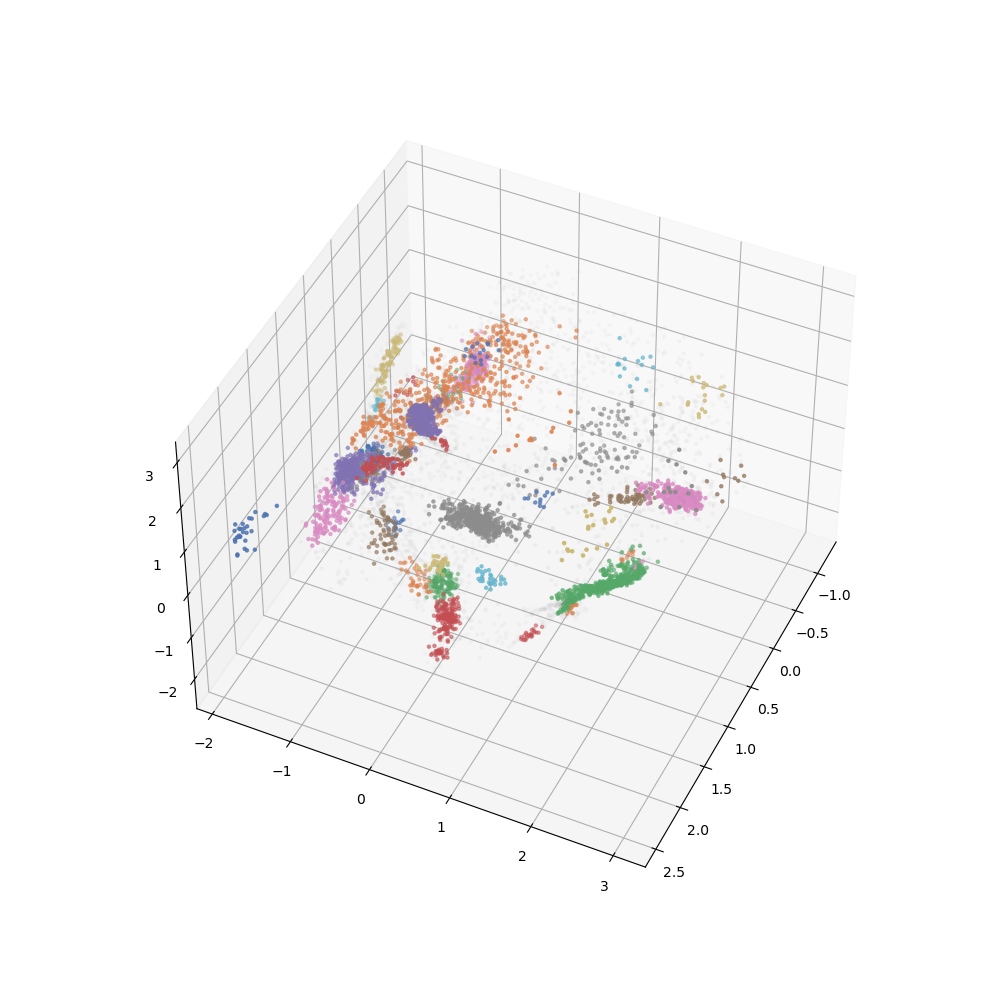

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs dire

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs dire

In [161]:
plt.close('all')
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(*AA_trajs.lowd[::10,:3].T, c=cluster_colors[::10], s=5)

**RMSDs**

In [154]:
cryst_struct = md.load('/mnt/scc3/andrejb/ARCHIVE/simulations/2017_04_27_G_2ub_k6_01_01/preproc/structure.gro')
cryst_struct = cryst_struct.atom_slice(cryst_struct.top.select('not resname LYQ and not resname GLQ'))
_ = cryst_struct.atom_slice(cryst_struct.top.select('not index 3 and not index 758'))

cryst_start_rmsds = []
cryst_fin_rmsds = []

for cluster_num in os.listdir('AA_clusters_trained_with_complete/'):
    if not os.path.isfile(f'AA_clusters_trained_with_complete/{cluster_num}/cluster_{cluster_num}_cart_centroid_sim.pdb'):
        break
    start = md.load(f'AA_clusters_trained_with_complete/{cluster_num}/cluster_{cluster_num}_cart_centroid.pdb')
    fin = md.load(f'AA_clusters_trained_with_complete/{cluster_num}/cluster_{cluster_num}_cart_centroid_sim.pdb')
    # print([i.n_atoms for i in [cryst_struct, start, fin]])
    cryst_start_rmsds.append(md.rmsd(cryst_struct, start)[0])
    cryst_fin_rmsds.append(md.rmsd(_, fin)[0])
labels = [i for i in range(len(cryst_start_rmsds))]

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


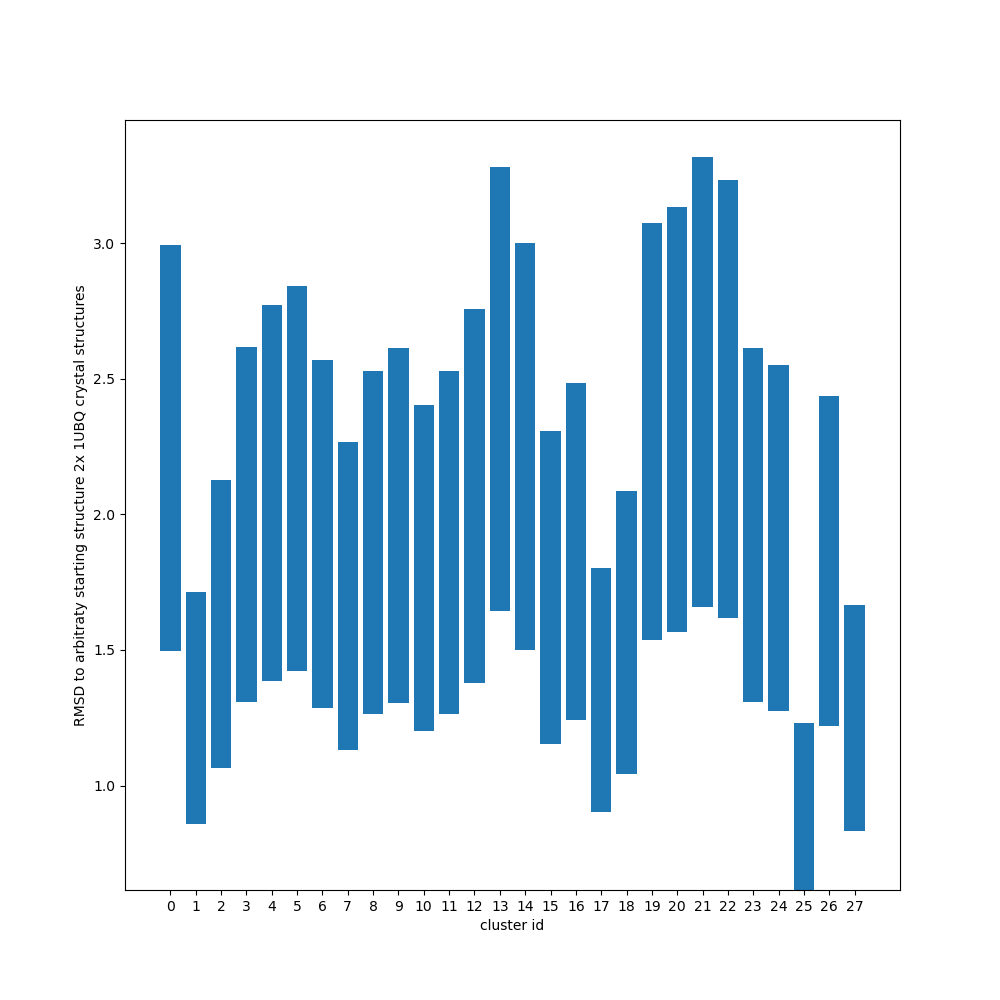

Text(0.5, 0, 'cluster id')

In [162]:
plt.close('all')
fig, ax = plt.subplots(figsize=(10, 10))
ax.bar(labels, cryst_fin_rmsds, bottom=cryst_start_rmsds)
ax.set_xticks(labels)
ax.set_xticklabels(labels)
ax.set_ylabel('RMSD to arbitraty starting structure 2x 1UBQ crystal structures')
ax.set_xlabel('cluster id')
# ax.bar(labels, women_means, width, yerr=women_std, bottom=men_means,
#        label='Women')

**Cluster 25**

<IPython.core.display.Javascript object>


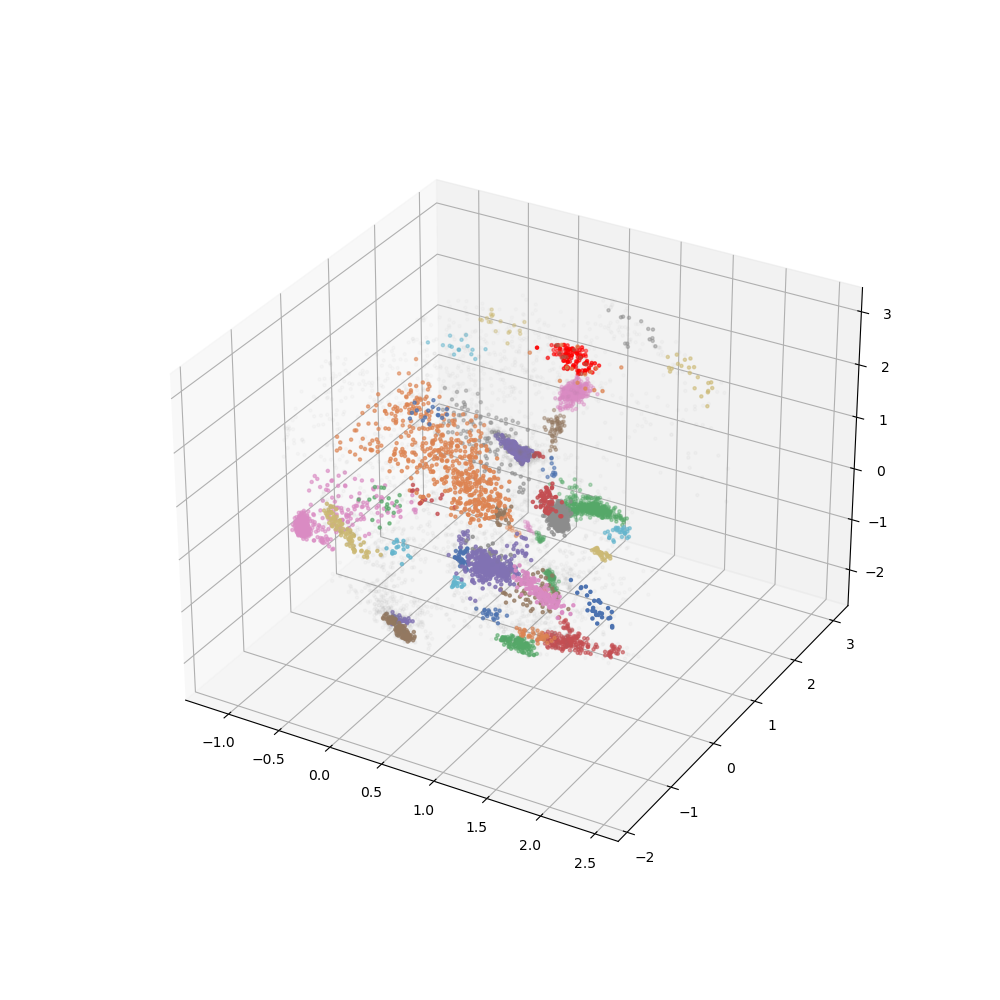

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return {key: val.dropna(val.attrs['feature_axis']).values.squeeze()[index] if np.any(xr.ufuncs.isnan(val)) else val.values.squeeze()[index] for key, val in self._CVs.data_vars.items()}
/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/xarray/core/dataarray.py:2743: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  return self.__array_wrap__(f(self.variable.data, *args, **kwargs))
/home/kevin/projects/encoder_map_private/encodermap/trajinfo/info_single.py:539: PendingDeprecationWarning: xarray.ufuncs will be deprecated when xarray no longer supports versions of numpy older than v1.17. Instead, use numpy ufuncs directly.
  r

In [163]:
plt.close('all')
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(*AA_trajs.lowd[::10,:3].T, c=cluster_colors[::10], s=5)
where = np.where(AA_trajs.cluster_membership == 25)[0]
ax.scatter(*AA_trajs.lowd[where,:3].T, c='red', s=5)

In [145]:
view, dummy_traj = em.misc.clustering.gen_dummy_traj(AA_trajs, 25, nglview=True, stack_atoms=True, shorten=True)
view

Provided alignment string results in 152 atoms. First atom is MET1-CA. Last atom is GLY76-CA.
superposed


NGLWidget()

## Possible solution 2: Learn more XPLOR-NIH and ask online for help.

Maybe some form of pre-minimization would allow the CG data to run.

Mailing lists.

# Outlook and ToDos:


- [ ] Very long XPLOR-NIH dynamics simulation to get idea about convergence.
- [ ] Summarize PSolPot and RelaxRatioPot parameters and make sure they are right.
- [ ] NN probably needs more training (problem with learning rate).